<a href="https://colab.research.google.com/github/Sahanduiuc/hrp/blob/master/Simulation_portfolio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   # <center> Simulation portfolio allocation methods </center> #

<br>
<br>
<br>

----

<br>
<br>


## LIBRARY

In [ ]:
%tensorflow_version 2.x
!pip install fastcluster
!pip install shap

import shap
import pickle
import os, sys
import sklearn 
import cvxpy as cp
import fastcluster
import numpy as np
import pandas as pd
import sklearn as sk
from math import ceil
import networkx as nx
import tensorflow as tf
from IPython import display
from scipy.stats import norm
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.optimize import minimize
from scipy.linalg import block_diag
from scipy.cluster import hierarchy
from sklearn.covariance import LedoitWolf
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import squareform
from sklearn.metrics import silhouette_samples
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from statsmodels.stats.correlation_tools import corr_nearest

sys.path.append(os.getcwd())
drive.mount('/content/drive')

     |████████████████████████████████| 163kB 5.4MB/s 
     |████████████████████████████████| 358kB 5.8MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491633 sha256=07572c20620c9b4cca1f1342a938c5e789efd1c833fa64cfc2559adcbec05c64
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.


Mounted at /content/drive


## IMPORT GAN MODEL

In [ ]:
!wget "https://sp500-histo.s3-ap-southeast-1.amazonaws.com/cCorrGAN_generator.h5"
generator = tf.keras.models.load_model('cCorrGAN_generator.h5', compile=False)

--2021-03-25 08:01:44--  https://sp500-histo.s3-ap-southeast-1.amazonaws.com/cCorrGAN_generator.h5
Resolving sp500-histo.s3-ap-southeast-1.amazonaws.com (sp500-histo.s3-ap-southeast-1.amazonaws.com)... 52.219.128.191
Connecting to sp500-histo.s3-ap-southeast-1.amazonaws.com (sp500-histo.s3-ap-southeast-1.amazonaws.com)|52.219.128.191|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18886432 (18M) [application/x-www-form-urlencoded]
Saving to: ‘cCorrGAN_generator.h5’

cCorrGAN_generator. 100%[===================>]  18.01M  34.8MB/s    in 0.5s    

2021-03-25 08:01:44 (34.8 MB/s) - ‘cCorrGAN_generator.h5’ saved [18886432/18886432]



## GENERATE CORRELATION MATRICES 

### Generate input latent points

In [ ]:
def generate_latent_points(n_samples):
    x_input = np.random.randn(80 * n_samples)
    z_input = x_input.reshape(n_samples, 80)
    labels = np.random.randint(0, 3, n_samples)
    return [z_input, labels]  

### Define PSD transformation

In [ ]:
def projected_matrix(correls):
    dim = len(correls)
    np.fill_diagonal(correls, 1)
    a, b = np.triu_indices(dim, k=1)
    correls[b, a] = correls[a, b]
    nearest_correls = corr_nearest(correls)
    np.fill_diagonal(nearest_correls, 1)
    nearest_correls[b, a] = nearest_correls[a, b]
    return nearest_correls

In [ ]:
def ordered_matrix(proj_matrix):
    dim = len(proj_matrix)
    np.fill_diagonal(proj_matrix, 1)
    dist = 1 - proj_matrix
    a, b = np.triu_indices(dim, k=1)
    z = fastcluster.linkage(dist[a, b], method='ward')
    permutation = (hierarchy
                   .leaves_list(hierarchy.optimal_leaf_ordering(
                       z, dist[a, b])))
    prows = proj_matrix[permutation, :]
    ordered_corr = prows[:, permutation]
    return ordered_corr

### Generation

In [ ]:
def generate_matrix(label, n=1000):
    #generate matrix
    latent_points, _ = generate_latent_points(n)
    labels = np.asarray([label for _ in range(n)]).reshape(-1, 1)
    X = generator.predict([latent_points, np.asarray(labels)])
    #correct them
    corrs = []
    for k in range(len(X)):
        corrs.append(ordered_matrix(projected_matrix(X[k, :, :, 0])))
        display.clear_output(wait=True)
        print(f"{k+1}/{X.shape[0]}")
    return np.asarray(corrs)

In [ ]:
risk_model_stressed = generate_matrix(0, n=15)
risk_model_normal = generate_matrix(1, n=15)
risk_model_rally = generate_matrix(2, n=15)

risk_model = {'stressed':risk_model_stressed,
              'normal':risk_model_normal,
              'rally':risk_model_rally}


Maximum iteration reached.



1/15



Maximum iteration reached.



2/15



Maximum iteration reached.



3/15



Maximum iteration reached.



4/15



Maximum iteration reached.



5/15



Maximum iteration reached.



6/15



Maximum iteration reached.



7/15



Maximum iteration reached.



8/15



Maximum iteration reached.



9/15



Maximum iteration reached.



10/15



Maximum iteration reached.



11/15



Maximum iteration reached.



12/15



Maximum iteration reached.



13/15



Maximum iteration reached.



14/15



Maximum iteration reached.



15/15



Maximum iteration reached.



1/15



Maximum iteration reached.



2/15



Maximum iteration reached.



3/15



Maximum iteration reached.



4/15



Maximum iteration reached.



5/15



Maximum iteration reached.



6/15



Maximum iteration reached.



7/15



Maximum iteration reached.



8/15



Maximum iteration reached.



9/15



Maximum iteration reached.



10/15



Maximum iteration reached.



11/15



Maximum iteration reached.



12/15



Maximum iteration reached.



13/15



Maximum iteration reached.



14/15



Maximum iteration reached.



15/15



Maximum iteration reached.



1/15



Maximum iteration reached.



2/15



Maximum iteration reached.



3/15



Maximum iteration reached.



4/15



Maximum iteration reached.



5/15



Maximum iteration reached.



6/15



Maximum iteration reached.



7/15



Maximum iteration reached.



8/15



Maximum iteration reached.



9/15



Maximum iteration reached.



10/15



Maximum iteration reached.



11/15



Maximum iteration reached.



12/15



Maximum iteration reached.



13/15



Maximum iteration reached.



14/15



Maximum iteration reached.



15/15


### Create folder

In [ ]:
FILE_DATA = "drive/MyDrive/GAN/Simulation_portfolio/" 
!mkdir -p "drive/MyDrive/GAN/Simulation_portfolio/"

### Save risk model

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'risk_model_999.obj', 'wb')
pickle.dump(risk_model, file_save)
file_save.close()

### Import risk model

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'risk_model_999.obj', 'rb')
risk_model = pickle.load(file_save)
file_save.close()

### Define feature extraction

In [ ]:
def compute_mst_stats(corr):
    dist = (1 - corr) / 2
    G = nx.from_numpy_matrix(dist) 
    mst = nx.minimum_spanning_tree(G)
    features = pd.Series()
    features['mst_avg_shortest'] = nx.average_shortest_path_length(mst)
    closeness_centrality = (pd
                            .Series(list(nx
                                         .closeness_centrality(mst)
                                         .values()))
                            .describe())
    for stat in closeness_centrality.index[1:]:
        features[f'mst_centrality_{stat}'] = closeness_centrality[stat]
    return features

In [ ]:
def compute_intravar_clusters(model_corr, Z, nb_clusters=5):
    clustering_inds = hierarchy.fcluster(Z, nb_clusters,
                                         criterion='maxclust')
    clusters = {i: [] for i in range(min(clustering_inds),
                                     max(clustering_inds) + 1)}
    for i, v in enumerate(clustering_inds):
        clusters[v].append(i)

    total_var = 0
    for cluster in clusters:
        sub_corr = model_corr[clusters[cluster], :][:, clusters[cluster]]
        sa, sb = np.triu_indices(sub_corr.shape[0], k=1)
        mean_corr = sub_corr[sa, sb].mean()
        cluster_var = sum(
            [(sub_corr[i, j] - mean_corr)**2 for i in range(len(sub_corr))
             for j in range(i + 1, len(sub_corr))])
        total_var += cluster_var
    
    return total_var

In [ ]:
def compute_features_from_correl(model_corr):
    n = len(model_corr)
    a, b = np.triu_indices(n, k=1)
  
    features = pd.Series()
    coefficients = model_corr[a, b].flatten()

    coeffs = pd.Series(coefficients)
    coeffs_stats = coeffs.describe()

    for stat in coeffs_stats.index[1:]:
        features[f'coeffs_{stat}'] = coeffs_stats[stat]

    features['coeffs_1%'] = coeffs.quantile(q=0.01)
    features['coeffs_99%'] = coeffs.quantile(q=0.99)
    features['coeffs_10%'] = coeffs.quantile(q=0.1)
    features['coeffs_90%'] = coeffs.quantile(q=0.9)
    features['coeffs_99-90'] = features['coeffs_99%'] - features['coeffs_90%']
    features['coeffs_10-1'] = features['coeffs_10%'] - features['coeffs_1%']
    # eigenvals
    eigenvals, eigenvecs = np.linalg.eig(model_corr)
    permutation = np.argsort(eigenvals)[::-1]
    eigenvals = eigenvals[permutation]
    eigenvecs = eigenvecs[:, permutation]

    pf_vector = eigenvecs[:, np.argmax(eigenvals)]
    if len(pf_vector[pf_vector < 0]) > len(pf_vector[pf_vector > 0]):
        pf_vector = -pf_vector

    features['varex_eig1'] = float(eigenvals[0] / sum(eigenvals))
    features['varex_eig_top5'] = (float(sum(eigenvals[:5])) /
        float(sum(eigenvals)))
    features['varex_eig_top30'] = (float(sum(eigenvals[:30])) /
        float(sum(eigenvals)))
    features['varex_5-1'] = (features['varex_eig_top5'] -
        features['varex_eig1'])
    features['varex_30-5'] = (features['varex_eig_top30'] -
        features['varex_eig_top5'])
    # Marcenko-Pastur (RMT)
    T, N = 252, n
    MP_cutoff = (1 + np.sqrt(N / T))**2
    # variance explained by eigenvals outside of the MP distribution
    features['varex_eig_MP'] = (
        float(sum([e for e in eigenvals if e > MP_cutoff])) /
        float(sum(eigenvals)))
    # determinant
    features['determinant'] = np.prod(eigenvals)
    # condition number
    features['condition_number'] = abs(eigenvals[0]) / abs(eigenvals[-1])
    # stats of the first eigenvector entries
    pf_stats = pd.Series(pf_vector).describe()
    for stat in pf_stats.index[1:]:
        features[f'pf_{stat}'] = float(pf_stats[stat])
    # stats on the MST
    features = pd.concat([features, compute_mst_stats(model_corr)],
                         axis=0)
    # stats on the linkage
    dist = np.sqrt(2 * (1 - model_corr))
    for algo in ['ward', 'single', 'complete', 'average']:
        Z = fastcluster.linkage(dist[a, b], method=algo)
        features[f'coph_corr_{algo}'] = cophenet(Z, dist[a, b])[0]
    # stats on the clusters
    Z = fastcluster.linkage(dist[a, b], method='ward')
    features['cl_intravar_5'] = compute_intravar_clusters(
        model_corr, Z, nb_clusters=5)
    features['cl_intravar_10'] = compute_intravar_clusters(
        model_corr, Z, nb_clusters=10)
    features['cl_intravar_25'] = compute_intravar_clusters(
        model_corr, Z, nb_clusters=25)
    features['cl_intravar_5-10'] = (
        features['cl_intravar_5'] - features['cl_intravar_10'])
    features['cl_intravar_10-25'] = (
        features['cl_intravar_10'] - features['cl_intravar_25'])
    return features.sort_index()

In [ ]:
def compute_dataset_features(mats):
    all_features = []
    for i in range(mats.shape[0]):
        all_features.append(compute_features_from_correl(mats[i, :, :]))
        display.clear_output(wait=True)    
        print(f"{i + 1}/{mats.shape[0]}")
    return pd.concat(all_features, axis=1).T

### Extract features

In [ ]:
features = {}
for regime in ['stressed', 'normal', 'rally']:
    features[regime] = compute_dataset_features(risk_model[regime]).astype(float)

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


1/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


2/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


3/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


4/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part


5/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part


6/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


7/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


8/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


9/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


10/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


11/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


12/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part


13/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part


14/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part


15/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values

1/15


Mean of empty slice.
invalid value encountered in double_scalars


2/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


3/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


4/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values

5/15
6/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


7/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


8/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


9/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


10/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


11/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


12/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


13/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part


14/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


15/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


1/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


2/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part


3/15


Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


4/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


5/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


6/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars
Casting complex values to real discards the imaginary part


7/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


8/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


9/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


10/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


11/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


12/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


13/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


14/15


Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Mean of empty slice.
invalid value encountered in double_scalars


15/15


Casting complex values to real discards the imaginary part


### Save features

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'features_999.obj', 'wb')
pickle.dump(features, file_save)
file_save.close()

### Import features

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'features_999.obj', 'rb')
features = pickle.load(file_save)
file_save.close()

## MAKE SOME SIMULATIONS

### First, let's define our methods

#### HRP

In [ ]:
def compute_MV_weights(covariances):
    inv_covar = np.linalg.inv(covariances)
    u = np.ones(len(covariances))
    
    return np.dot(inv_covar, u) / np.dot(u, np.dot(inv_covar, u))


def compute_RP_weights(covariances):
    weights = (1 / np.diag(covariances)) 
    
    return weights / sum(weights)


def compute_unif_weights(covariances):
    
    return [1 / len(covariances) for i in range(len(covariances))]


def seriation(Z, N, cur_index):
    if cur_index < N:
        return [cur_index]
    else:
        left = int(Z[cur_index - N, 0])
        right = int(Z[cur_index - N, 1])
        return (seriation(Z, N, left) + seriation(Z, N, right))

    
def compute_serial_matrix(dist_mat, method="ward"):
    N = len(dist_mat)
    flat_dist_mat = squareform(dist_mat)
    res_linkage = linkage(flat_dist_mat, method=method)
    res_order = seriation(res_linkage, N, N + N - 2)
    seriated_dist = np.zeros((N, N))
    a,b = np.triu_indices(N, k=1)
    seriated_dist[a,b] = dist_mat[[res_order[i] for i in a],
                                  [res_order[j] for j in b]]
    seriated_dist[b,a] = seriated_dist[a,b]
    
    return seriated_dist, res_order, res_linkage


def compute_HRP_weights(x):
    covariances = np.cov(x)
    vols = np.sqrt(np.diag(covariances))
    correl_mat = np.multiply(covariances,
                         np.outer(vols**-1, vols**-1))
    # deal with precision errors
    np.fill_diagonal(correl_mat, 1)
    distances = np.sqrt((1 - correl_mat) / 2)
    # deal with precision errors
    np.fill_diagonal(distances, 0)
    ordered_dist_mat, res_order, res_linkage = compute_serial_matrix(
        distances, method='single')
    weights = pd.Series(1, index=res_order)
    clustered_alphas = [res_order]

    while len(clustered_alphas) > 0:
        clustered_alphas = [cluster[start:end] for cluster in clustered_alphas
                            for start, end in ((0, len(cluster) // 2),
                                               (len(cluster) // 2, len(cluster)))
                            if len(cluster) > 1]
        for subcluster in range(0, len(clustered_alphas), 2):
            left_cluster = clustered_alphas[subcluster]
            right_cluster = clustered_alphas[subcluster + 1]

            left_subcovar = covariances[left_cluster, :][:, left_cluster]
            inv_diag = 1 / np.diag(left_subcovar)
            parity_w = inv_diag * (1 / np.sum(inv_diag))
            left_cluster_var = np.dot(parity_w, np.dot(left_subcovar, parity_w))

            right_subcovar = covariances[right_cluster, :][:, right_cluster]
            inv_diag = 1 / np.diag(right_subcovar)
            parity_w = inv_diag * (1 / np.sum(inv_diag))
            right_cluster_var = np.dot(parity_w,
                                       np.dot(right_subcovar, parity_w))

            alloc_factor = 1 - left_cluster_var / (left_cluster_var +
                                                   right_cluster_var)

            weights[left_cluster] *= alloc_factor
            weights[right_cluster] *= 1 - alloc_factor
            
    return weights.to_numpy()


#### NCO

In [ ]:
class NestedClusteredOptimisation:

    def __init__(self):
        return

    def allocate_cvo(self, cov, mu_vec=None):
        
        if cov.shape[0] == cov.shape[1] and np.linalg.matrix_rank(cov) == cov.shape[0]:
            inv_cov = np.linalg.inv(cov)
        else:
            inv_cov = np.linalg.pinv(cov)
        ones = np.ones(shape=(inv_cov.shape[0], 1))

        if mu_vec is None:
            mu_vec = ones

        w_cvo = np.dot(inv_cov, mu_vec)
        w_cvo /= np.dot(mu_vec.T, w_cvo)

        return w_cvo

    def allocate_nco(self, cov, mu_vec=None, max_num_clusters=None, n_init=10):
        cov = pd.DataFrame(cov)
        if mu_vec is not None:
            mu_vec = pd.Series(mu_vec[:, 0])

        std = np.sqrt(np.diag(cov))
        corr = cov / np.outer(std, std)
        corr[corr < -1], corr[corr > 1] = -1, 1

        corr, clusters, _ = self._cluster_kmeans_base(corr, max_num_clusters, n_init=n_init)
        w_intra_clusters = pd.DataFrame(0, index=cov.index, columns=clusters.keys())

        for i in clusters:
            cov_cluster = cov.loc[clusters[i], clusters[i]].values
            mu_cluster = (None if mu_vec is None else mu_vec.loc[clusters[i]].values.reshape(-1, 1))
            w_intra_clusters.loc[clusters[i], i] = self.allocate_cvo(cov_cluster, mu_cluster).flatten()

        cov_inter_cluster = w_intra_clusters.T.dot(np.dot(cov, w_intra_clusters))
        mu_inter_cluster = (None if mu_vec is None else w_intra_clusters.T.dot(mu_vec))

        w_inter_clusters = pd.Series(self.allocate_cvo(cov_inter_cluster, mu_inter_cluster).flatten(),
                                     index=cov_inter_cluster.index)
        w_nco = w_intra_clusters.mul(w_inter_clusters, axis=1).sum(axis=1).values.reshape(-1, 1)

        return w_nco


    @staticmethod
    def _cluster_kmeans_base(corr, max_num_clusters=None, n_init=10):

        dist_matrix = ((1 - corr.fillna(0)) / 2) ** (1 / 2)
        silh_coef_optimal = pd.Series(dtype='float64')

        if max_num_clusters is None:
            max_num_clusters = ceil(corr.shape[0] / 2)

        for init in range(1, n_init+1):
            for num_clusters in range(2, max_num_clusters + 1):
                kmeans = KMeans(n_clusters=num_clusters, n_init=init)
                kmeans = kmeans.fit(dist_matrix)

                silh_coef = silhouette_samples(dist_matrix, kmeans.labels_)
                stat = (silh_coef.mean() / silh_coef.std(), silh_coef_optimal.mean() / silh_coef_optimal.std())

                if np.isnan(stat[1]) or stat[0] > stat[1]:
                    silh_coef_optimal = silh_coef
                    kmeans_optimal = kmeans

        new_index = np.argsort(kmeans_optimal.labels_)
        corr = corr.iloc[new_index]
        corr = corr.iloc[:, new_index]

        clusters = {i: corr.columns[np.where(kmeans_optimal.labels_ == i)[0]].tolist() for \
                    i in np.unique(kmeans_optimal.labels_)}

        silh_coef_optimal = pd.Series(silh_coef_optimal, index=dist_matrix.index)
        return corr, clusters, silh_coef_optimal

In [ ]:
def nco(x):
    cov = np.cov(x)
    NCO = NestedClusteredOptimisation()
    return NCO.allocate_nco(cov).reshape(80,)

#### HERC

In [ ]:
def hierarchical_clustering(correl_mat):
    dist = 1 - correl_mat
    dim = len(dist)
    tri_a, tri_b = np.triu_indices(dim, k=1)
    Z = fastcluster.linkage(dist[tri_a, tri_b], method='ward')
    permutation = hierarchy.leaves_list(
        hierarchy.optimal_leaf_ordering(Z, dist[tri_a, tri_b]))
    ordered_corr = correl_mat[permutation, :][:, permutation]

    nb_clusters = 7
    clustering_inds = fcluster(Z, nb_clusters, criterion='maxclust')
    clusters = {i: [] for i in range(min(clustering_inds),
                                    max(clustering_inds) + 1)}
    for i, v in enumerate(clustering_inds):
        clusters[v].append(i)
    return Z, clusters, dim
    


def seriation(Z, dim, cur_index):
    if cur_index < dim:
        return [cur_index]
    else:
        left = int(Z[cur_index - dim, 0])
        right = int(Z[cur_index - dim, 1])
        return seriation(Z, dim, left) + seriation(Z, dim, right)
    
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2))

def compute_HERC_weights(x):
    covar = np.cov(x)
    Z, clusters, dim = hierarchical_clustering(covar)
    nb_clusters = len(clusters)
    assets_weights = np.array([1.] * len(covar))
    clusters_weights = np.array([1.] * nb_clusters)
    clusters_var = np.array([0.] * nb_clusters)
    
    for id_cluster, cluster in clusters.items():
        cluster_covar = covar[cluster, :][:, cluster]
        inv_diag = 1 / np.diag(cluster_covar)
        assets_weights[cluster] = inv_diag / np.sum(inv_diag)
        
    for id_cluster, cluster in clusters.items():
        weights = assets_weights[cluster]
        clusters_var[id_cluster - 1] = np.dot(
            weights, np.dot(covar[cluster, :][:, cluster], weights))
        
    for merge in range(nb_clusters - 1):
        left = int(Z[dim - 2 - merge, 0])
        right = int(Z[dim - 2 - merge, 1])
        left_cluster = seriation(Z, dim, left)
        right_cluster = seriation(Z, dim, right)

        ids_left_cluster = []
        ids_right_cluster = []
        for id_cluster, cluster in clusters.items():
            if sorted(intersection(left_cluster, cluster)) == sorted(cluster):
                ids_left_cluster.append(id_cluster)
            if sorted(intersection(right_cluster, cluster)) == sorted(cluster):
                ids_right_cluster.append(id_cluster)


        ids_left_cluster = np.array(ids_left_cluster) - 1
        ids_right_cluster = np.array(ids_right_cluster) - 1

        alpha = 0
        left_cluster_var = np.sum(clusters_var[ids_left_cluster])
        right_cluster_var = np.sum(clusters_var[ids_right_cluster])
        alpha = left_cluster_var / (left_cluster_var + right_cluster_var)

        clusters_weights[ids_left_cluster] = clusters_weights[
            ids_left_cluster] * alpha
        clusters_weights[ids_right_cluster] = clusters_weights[
            ids_right_cluster] * (1 - alpha)

    for id_cluster, cluster in clusters.items():
        assets_weights[cluster] = assets_weights[cluster] * clusters_weights[
            id_cluster - 1]
        
    return assets_weights

#### Mean-variance methods

In [ ]:
def inverse_variance(x):
    covariance = np.cov(x)
    ivp = 1. / np.diag(covariance)
    ivp /= ivp.sum()
    return ivp


def min_volatility(x):
    covariance = np.cov(x)
    num_assets = 80
    weight_bounds = (0, 1)

    weights = cp.Variable(num_assets)
    weights.value = np.array([1 / num_assets] * num_assets)
    risk = cp.quad_form(weights, covariance)

    # Optimisation objective and constraints
    allocation_objective = cp.Minimize(0.5 * risk)
    allocation_constraints = [cp.sum(weights) == 1]
    if isinstance(weight_bounds, tuple):
        allocation_constraints.extend(
            [
                weights >= weight_bounds[0],
                weights <= min(weight_bounds[1], 1)
            ]
        )
    else:
        for inequality in weight_bounds:
            allocation_constraints.append(eval(inequality))
        # Add the hard-boundaries for weights.
        allocation_constraints.extend([weights <= 1, weights >= 0])

    # Define and solve the problem
    problem = cp.Problem(
        objective=allocation_objective,
        constraints=allocation_constraints)
    problem.solve(warm_start=True)

    if weights.value is None:
        raise ValueError('No optimal set of weights found.')

    return weights.value

def max_decorrelation(x):
    covariance = np.cov(x)
    num_assets = 80
    weight_bounds = (0, 1)

    weights = cp.Variable(num_assets)
    weights.value = np.array([1 / num_assets] * num_assets)
    risk = cp.quad_form(weights, covariance)

    std = np.sqrt(np.diag(covariance))
    corr = covariance / np.outer(std, std)
    corr[corr < -1], corr[corr > 1] = -1, 1
    portfolio_correlation = cp.quad_form(weights, corr)

    # Optimisation objective and constraints
    allocation_objective = cp.Minimize(portfolio_correlation)
    allocation_constraints = [
        cp.sum(weights) == 1
    ]
    if isinstance(weight_bounds, tuple):
        allocation_constraints.extend(
            [
                weights >= weight_bounds[0],
                weights <= min(weight_bounds[1], 1)
            ]
        )
    else:
        for inequality in weight_bounds:
            allocation_constraints.append(eval(inequality))

        # Add the hard-boundaries for weights.
        allocation_constraints.extend(
            [
                weights <= 1,
                weights >= 0
            ]
        )

    # Define and solve the problem
    problem = cp.Problem(
        objective=allocation_objective,
        constraints=allocation_constraints
    )
    problem.solve(warm_start=True)
    if weights.value is None:
        raise ValueError('No optimal set of weights found.')

    return weights.value    

def max_diversification(x):
    covariance = np.cov(x)
    weights = max_decorrelation(covariance)
    # Divide weights by individual asset volatilities
    weights /= np.diag(covariance)
    # Standardize weights
    weights /= np.sum(weights)
    return weights

def max_return_min_volatility(x, risk_aversion=10):
    covariance = np.cov(x)
    num_assets = 80
    weight_bounds = (0, 1)
    expected_returns = np.mean(x, axis=1)

    weights = cp.Variable(num_assets)
    weights.value = np.array([1 / num_assets] * num_assets)
    portfolio_return = cp.matmul(weights, expected_returns)
    risk = cp.quad_form(weights, covariance)

    # Optimisation objective and constraints
    allocation_objective = cp.Minimize(risk_aversion * risk - portfolio_return)
    allocation_constraints = [
        cp.sum(weights) == 1
    ]
    if isinstance(weight_bounds, tuple):
        allocation_constraints.extend(
            [
                weights >= weight_bounds[0],
                weights <= min(weight_bounds[1], 1)
            ]
        )
    else:
        for inequality in weight_bounds:
            allocation_constraints.append(eval(inequality))

        # Add the hard-boundaries for weights.
        allocation_constraints.extend(
            [
                weights <= 1,
                weights >= 0
            ]
        )

    # Define and solve the problem
    problem = cp.Problem(
        objective=allocation_objective,
        constraints=allocation_constraints
    )
    problem.solve(warm_start=True)
    if weights.value is None:
        raise ValueError('No optimal set of weights found.')

    return weights.value



#### Dictionnary of methods

In [ ]:
methods = {
    'Min Volatility': min_volatility,
    'Hierarchical Risk Parity': compute_HRP_weights,
    'Max Return Min Volatility': max_return_min_volatility,
    'Max Diversification': max_diversification,
    'Max Decorrelation': max_decorrelation,
    #'Nested Clustered Optimisation':nco,
    'Hierarchical Equal Risk Contribution':compute_HERC_weights,
    'Inverse Variance': inverse_variance,
}

### Define our metrics

In [ ]:
class RiskMetrics:

    def __init__(self):
        return

    @staticmethod
    def calculate_variance(covariance, weights):
        return np.dot(weights, np.dot(covariance, weights))

    @staticmethod
    def calculate_value_at_risk(returns, confidence_level=0.05):

        if not isinstance(returns, pd.DataFrame):
            returns = pd.DataFrame(returns)

        return returns.quantile(confidence_level, interpolation='higher')[0]

    def calculate_expected_shortfall(self, returns, confidence_level=0.05):

        if not isinstance(returns, pd.DataFrame):
            returns = pd.DataFrame(returns)

        value_at_risk = self.calculate_value_at_risk(returns, confidence_level)
        expected_shortfall = np.nanmean(returns[returns < value_at_risk])
        return expected_shortfall

    @staticmethod
    def calculate_conditional_drawdown_risk(returns, confidence_level=0.05):
        if not isinstance(returns, pd.DataFrame):
            returns = pd.DataFrame(returns)

        drawdown = returns.expanding().max() - returns
        max_drawdown = drawdown.expanding().max()

        max_drawdown_at_confidence_level = max_drawdown.quantile(1 - confidence_level, interpolation='higher')
        conditional_drawdown = np.nanmean(max_drawdown[max_drawdown >= max_drawdown_at_confidence_level])
        return conditional_drawdown


In [ ]:
RM = RiskMetrics()
metrics = {
    'Standard deviation': lambda x:np.std(x),
    'Value at risk': RiskMetrics.calculate_value_at_risk,
    'Expected shortfall': RM.calculate_expected_shortfall,
    'Conditional drawdown risk': RiskMetrics.calculate_conditional_drawdown_risk
}

### Let's apply each method

In [ ]:
def apply_methods(insample, outsample, info_model, methods, metrics):
    res = []
    _, id, regime = info_model
    for method_name, method in methods.items():
        #Compute weights
        weights = method(insample.T)
        
        #Apply on in and out sample
        insample_portfolio_rets = np.dot(insample, weights)
        outsample_portfolio_rets = np.dot(outsample, weights)

        subres = [id, regime, method_name]
        for metric in metrics.values():
            insample_metric = metric(insample_portfolio_rets)
            outsample_metric = metric(outsample_portfolio_rets)
            subres += [insample_metric, outsample_metric]
        res.append(subres)
    return res

### Define simulation processing

In [ ]:
def make_simulations(info_model, n, methods, metrics):
    res = []
    dim = len(info_model[0])
    risk_model, k, regime = info_model
    for simu in range(n):
        display.clear_output(wait=True)
        print(f"Model n°{k} | {regime} regime | simulation {simu+1}/{n}")
        returns = np.random.multivariate_normal(mean=np.zeros(dim), 
                                                cov=risk_model, 
                                                size=500)
        returns_insample = returns[:250, :]
        returns_outsample = returns[250:, :]
        res += apply_methods(returns_insample, returns_outsample, 
                             info_model, methods, metrics)
    return res

### Make simulations for each matrix of each regime

In [ ]:
def launch_simulations(risk_model, methods, metrics, n_simulation=1000):
    res, n = [], 0
    for i,(regime, regime_risk_model) in enumerate(risk_model.items()):
        for k in range(len(regime_risk_model)): 
            info_model = (regime_risk_model[k, :, :],n+k+1, regime)
            res += make_simulations(info_model, n_simulation, methods, metrics)
        n += len(regime_risk_model)
    return res

In [ ]:
%%time
simu_results = pd.DataFrame(launch_simulations(risk_model, methods, 
                                               metrics, n_simulation=1000))

name_col = np.asarray([[f'insample_{x}', f'outsample_{x}'] for x in list(metrics.keys())]).flatten()
simu_results.columns = ['id_risk_model', 'regime', 'method'] + list(name_col)


In [ ]:
simu_results

### Save simulation results

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'simu_results_999.obj', 'wb')
pickle.dump(simu_results, file_save)
file_save.close()

### Import simulation results

In [ ]:
#CHANGE NAME AT EACH LAUNCH
file_save = open(FILE_DATA+'simu_results_999.obj', 'rb')
simu_results = pickle.load(file_save)
file_save.close()

## CONCATENATE ALL SIMULATIONS

### Concatenate

In [ ]:
def concatenate_all_data(n):
    simu_results = []
    for k in range(n):
        file_simu = open(FILE_DATA+f'simu_results_{k+1}.obj', 'rb')
        file_features = open(FILE_DATA+f'features_{k+1}.obj', 'rb')

        simu_result = pickle.load(file_simu)
        feature = pickle.load(file_features)
        file_simu.close()
        file_features.close()

        features_name = feature['stressed'].columns
        features = pd.concat(list(feature.values()))
        features.reset_index(inplace=True, drop=True)
        features['id_risk_model'] = k * len(features) + features.index + 1

        simu_result['id_risk_model'] = simu_result['id_risk_model'].iloc[-1] * k + simu_result['id_risk_model']
        simu_result = pd.concat([simu_result, pd.get_dummies(simu_result['regime'])], axis=1)
        simu_results.append(simu_result.merge(features, on='id_risk_model'))
        
    simu_results = pd.concat(simu_results)
    features_name = np.concatenate([features_name, ['stressed', 'normal', 'rally']])
    return simu_results, features_name

### Save concatenate data

In [ ]:
simu_results, features_name = concatenate_all_data(20)
file_save = open(FILE_DATA+'simu_results.obj', 'wb')
pickle.dump(simu_results, file_save)
file_save.close()

### Import concatenated data

In [ ]:
features_name = ['cl_intravar_10', 'cl_intravar_10-25', 'cl_intravar_25', 'cl_intravar_5',
'cl_intravar_5-10', 'coeffs_1%', 'coeffs_10%', 'coeffs_10-1', 'coeffs_25%',
'coeffs_50%', 'coeffs_75%', 'coeffs_90%', 'coeffs_99%', 'coeffs_99-90',
'coeffs_max', 'coeffs_mean', 'coeffs_min', 'coeffs_std', 'condition_number',
'coph_corr_average', 'coph_corr_complete', 'coph_corr_single',
'coph_corr_ward', 'determinant', 'mst_avg_shortest', 'mst_centrality_25%',
'mst_centrality_50%', 'mst_centrality_75%', 'mst_centrality_max',
'mst_centrality_mean', 'mst_centrality_min', 'mst_centrality_std', 'pf_25%',
'pf_50%', 'pf_75%', 'pf_max', 'pf_mean', 'pf_min', 'pf_std', 'varex_30-5',
'varex_5-1', 'varex_eig1', 'varex_eig_MP', 'varex_eig_top30',
'varex_eig_top5', 'stressed', 'normal', 'rally']


In [ ]:
file_save = open(FILE_DATA+f'simu_results.obj', 'rb')
simu_results = pickle.load(file_save)
file_save.close()
simu_results

,id_risk_model,regime,method,insample_Standard deviation,outsample_Standard deviation,insample_Value at risk,outsample_Value at risk,insample_Expected shortfall,outsample_Expected shortfall,insample_Conditional drawdown risk,outsample_Conditional drawdown risk,normal,rally,stressed,cl_intravar_10,cl_intravar_10-25,cl_intravar_25,cl_intravar_5,cl_intravar_5-10,coeffs_1%,coeffs_10%,coeffs_10-1,coeffs_25%,coeffs_50%,coeffs_75%,coeffs_90%,coeffs_99%,coeffs_99-90,coeffs_max,coeffs_mean,coeffs_min,coeffs_std,condition_number,coph_corr_average,coph_corr_complete,coph_corr_single,coph_corr_ward,determinant,mst_avg_shortest,mst_centrality_25%,mst_centrality_50%,mst_centrality_75%,mst_centrality_max,mst_centrality_mean,mst_centrality_min,mst_centrality_std,pf_25%,pf_50%,pf_75%,pf_max,pf_mean,pf_min,pf_std,varex_30-5,varex_5-1,varex_eig1,varex_eig_MP,varex_eig_top30,varex_eig_top5
0,1,stressed,Min Volatility,0.533223,0.497487,-0.824743,-0.750484,-1.063201,-1.036320,2.888241,3.223754,0,0,1,3.134550,2.451259,0.683292,6.233073,3.098523,0.016288,0.328251,0.311962,0.394517,0.474273,0.547504,0.610226,0.716037,0.105812,0.899781,0.465834,-0.156864,0.122748,1.355123e+17,0.833310,0.621934,0.764986,0.358983,-8.285235e-246,5.179114,0.168269,0.192683,0.226699,0.311024,0.200508,0.127010,0.039240,0.101363,0.112275,0.122068,0.141179,0.110362,0.019299,0.018005,0.276033,0.106688,0.484648,0.517190,0.867368,0.591335
1,1,stressed,Hierarchical Risk Parity,0.745340,0.709966,-1.093333,-1.152231,-1.451922,-1.487595,3.638693,4.345912,0,0,1,3.134550,2.451259,0.683292,6.233073,3.098523,0.016288,0.328251,0.311962,0.394517,0.474273,0.547504,0.610226,0.716037,0.105812,0.899781,0.465834,-0.156864,0.122748,1.355123e+17,0.833310,0.621934,0.764986,0.358983,-8.285235e-246,5.179114,0.168269,0.192683,0.226699,0.311024,0.200508,0.127010,0.039240,0.101363,0.112275,0.122068,0.141179,0.110362,0.019299,0.018005,0.276033,0.106688,0.484648,0.517190,0.867368,0.591335
2,1,stressed,Max Return Min Volatility,0.533289,0.498213,-0.818739,-0.756476,-1.064247,-1.036354,2.883063,3.248875,0,0,1,3.134550,2.451259,0.683292,6.233073,3.098523,0.016288,0.328251,0.311962,0.394517,0.474273,0.547504,0.610226,0.716037,0.105812,0.899781,0.465834,-0.156864,0.122748,1.355123e+17,0.833310,0.621934,0.764986,0.358983,-8.285235e-246,5.179114,0.168269,0.192683,0.226699,0.311024,0.200508,0.127010,0.039240,0.101363,0.112275,0.122068,0.141179,0.110362,0.019299,0.018005,0.276033,0.106688,0.484648,0.517190,0.867368,0.591335
3,1,stressed,Max Diversification,0.547520,0.493482,-0.866357,-0.748814,-1.085821,-1.009168,2.781888,3.244694,0,0,1,3.134550,2.451259,0.683292,6.233073,3.098523,0.016288,0.328251,0.311962,0.394517,0.474273,0.547504,0.610226,0.716037,0.105812,0.899781,0.465834,-0.156864,0.122748,1.355123e+17,0.833310,0.621934,0.764986,0.358983,-8.285235e-246,5.179114,0.168269,0.192683,0.226699,0.311024,0.200508,0.127010,0.039240,0.101363,0.112275,0.122068,0.141179,0.110362,0.019299,0.018005,0.276033,0.106688,0.484648,0.517190,0.867368,0.591335
4,1,stressed,Max Decorrelation,0.536640,0.492643,-0.831379,-0.796147,-1.081427,-1.010713,2.839243,3.215627,0,0,1,3.134550,2.451259,0.683292,6.233073,3.098523,0.016288,0.328251,0.311962,0.394517,0.474273,0.547504,0.610226,0.716037,0.105812,0.899781,0.465834,-0.156864,0.122748,1.355123e+17,0.833310,0.621934,0.764986,0.358983,-8.285235e-246,5.179114,0.168269,0.192683,0.226699,0.311024,0.200508,0.127010,0.039240,0.101363,0.112275,0.122068,0.141179,0.110362,0.019299,0.018005,0.276033,0.106688,0.484648,0.517190,0.867368,0.591335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314995,900,rally,Max Return Min Volatility,0.405633,0.455016,-0.660266,-0.740276,-0.809952,-0.935914,2.032436,2.141056,0,1,0,2.356185,1.965083,0.391103,6.124471,3.768286,-0.044273,0.153538,0.197811,0.250018,0.376084,0.

## ANALYSE RESULTS

### Have a look on distribituion

In [ ]:
def plot_distribution(A, B, la, lb, name, metric, min=True):
    plt.figure(figsize=(15, 5));
    plt.subplot(1, 2, 1);
    plt.title(f'Distribution\n{name}');
    plt.xlabel(metric);
    plt.hist(A, bins=200,label=la)
    plt.hist(B, bins=200, alpha=0.4, label=lb)
    
    plt.axvline(x=np.mean(A), color='b', linestyle='dashed', linewidth=2)
    plt.axvline(x=np.mean(B), color='r', linestyle='dashed', linewidth=2)
    plt.legend()
    plt.subplot(1, 2, 2);
    plt.title(f'Distribution of error\n{name}');
    plt.xlabel(f'Relative Error on {metric}');
    error = (B - A)
    error_rel = error / (np.min(np.column_stack((A, B)), axis=1) if min else A)
    plt.hist(error_rel, bins=200)
    plt.axvline(x=0, color='k', linestyle='dashed', linewidth=2)
    plt.axvline(x=np.mean(error_rel), color='b', linestyle='dashed', linewidth=2)
    plt.show();
    return np.abs(np.mean(error_rel))

#### Distribution on outsample and insample

In [ ]:
def show_distribution_1(metric, name_method, simu_results):
    method = simu_results[simu_results['method'] == name_method]
    insample = method[f'insample_{metric}'].to_numpy()
    outsample = method[f'outsample_{metric}'].to_numpy()
    return plot_distribution(insample, outsample,
                            'insample', 'outsample', 
                             name_method, metric)
    

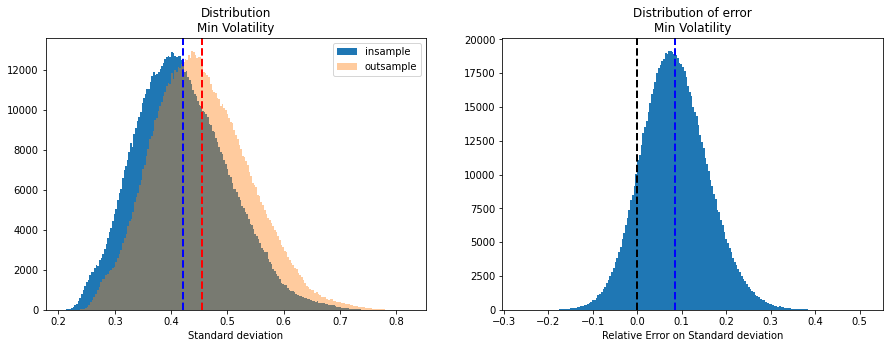

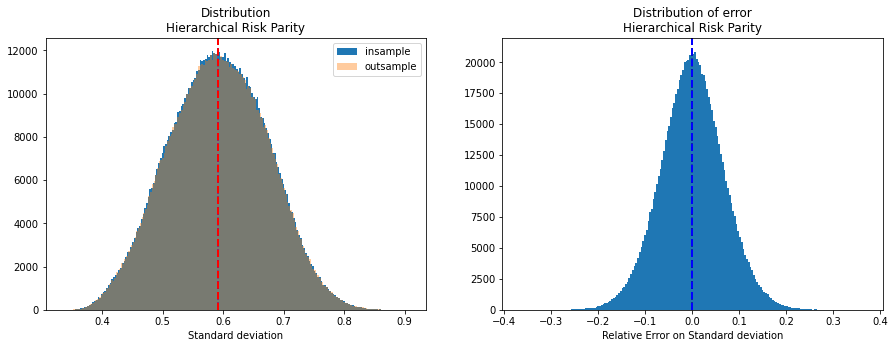

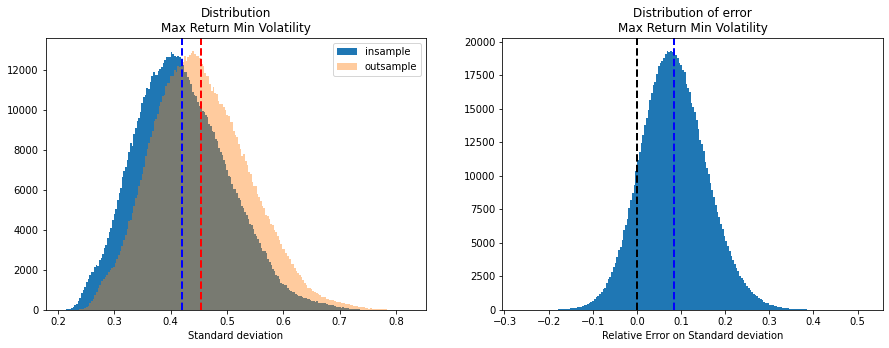

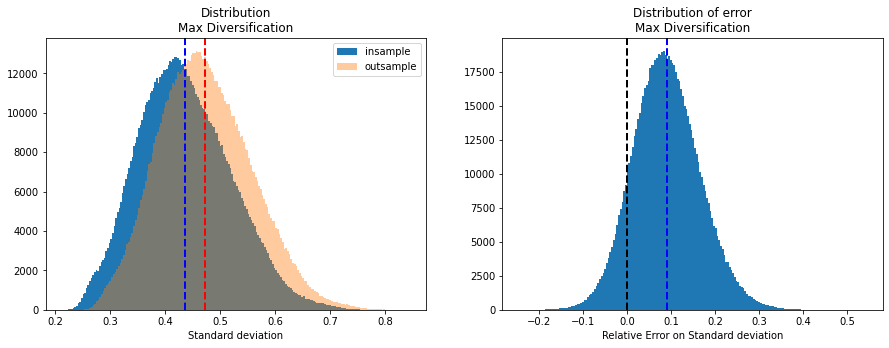

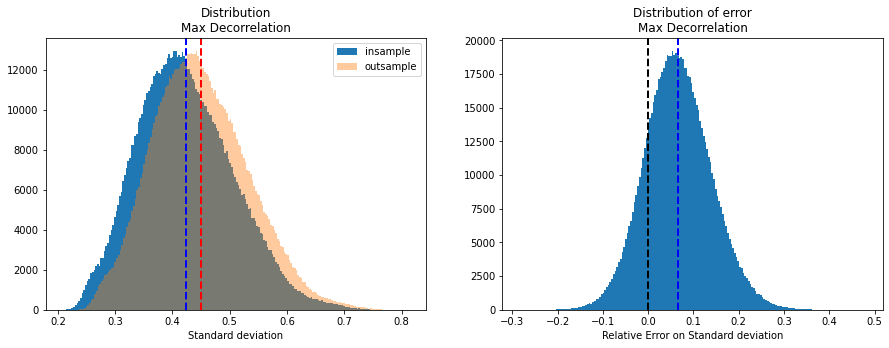

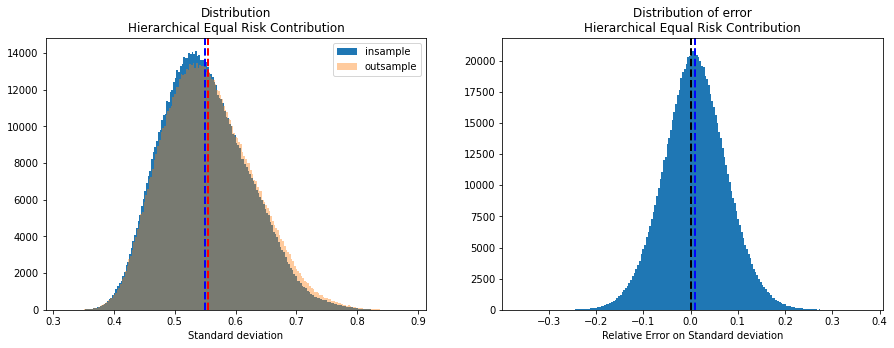

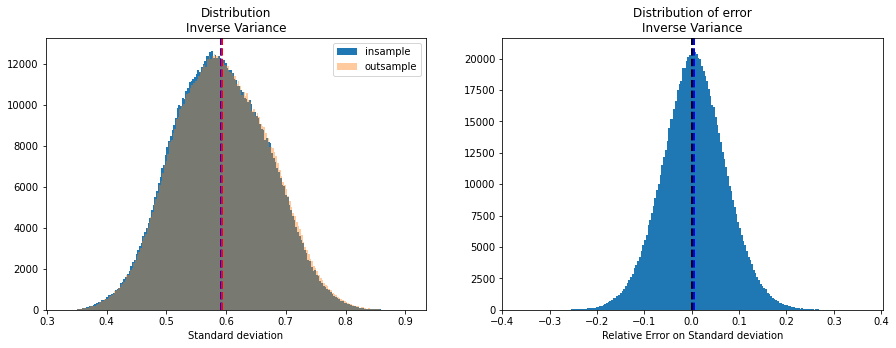

In [ ]:
rk_1 = {}
metric_1 = 'Standard deviation'
for m in pd.unique(simu_results['method']):
    rk_1[m] = show_distribution_1(metric_1, m, simu_results)
    print('')

#### Distribution on outsample A and outsample B (B-A)

In [ ]:
def show_distribution_2(metric, name_methodA, name_methodB , simu_results):
    methodA = simu_results[simu_results['method'] == name_methodA]
    methodB = simu_results[simu_results['method'] == name_methodB]
    outsampleA = methodA[f'outsample_{metric}'].to_numpy()
    outsampleB = methodB[f'outsample_{metric}'].to_numpy()
    return plot_distribution(outsampleA, outsampleB,
                      'outsampleA', 'outsampleB', 
                      f"{name_methodB} - {name_methodA}", metric, min=False)
    

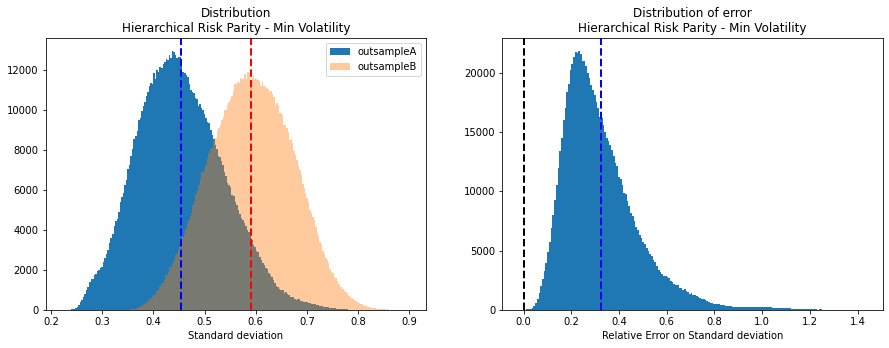

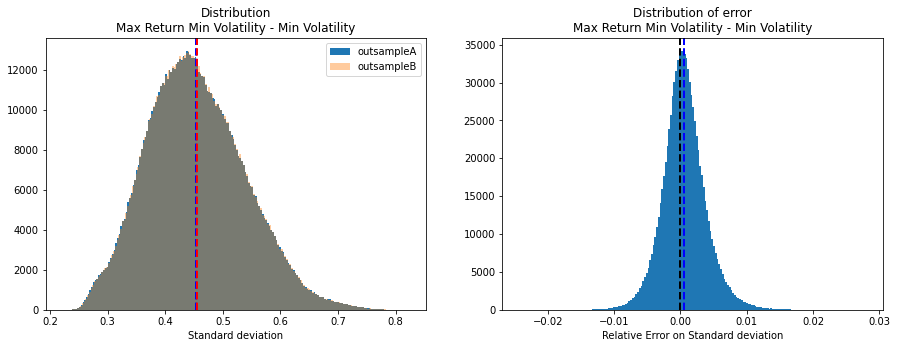

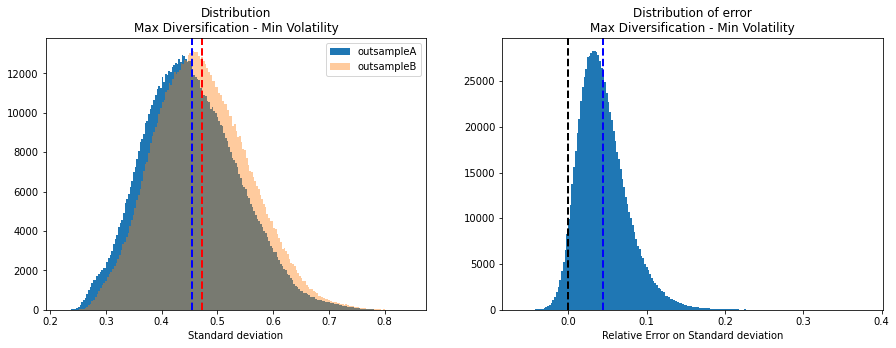

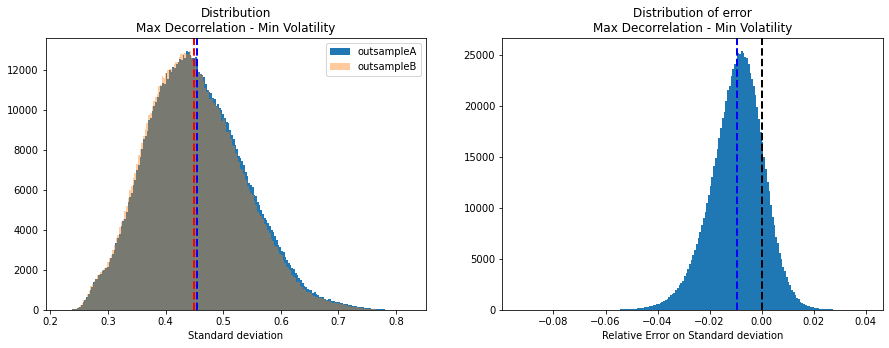

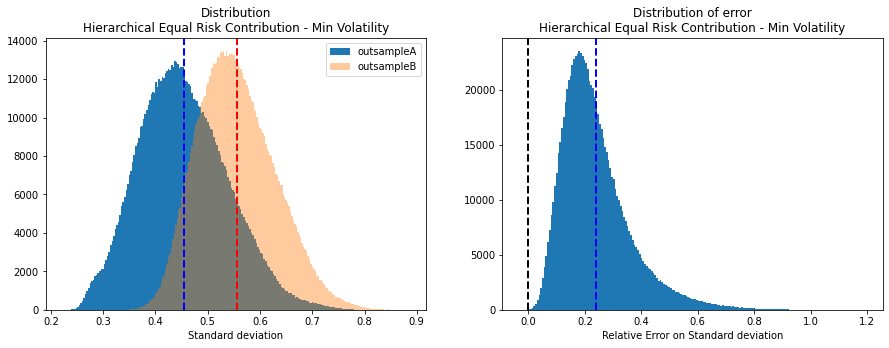

...

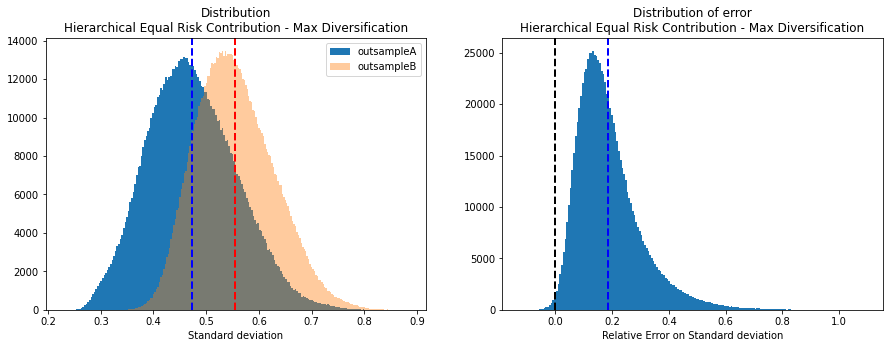

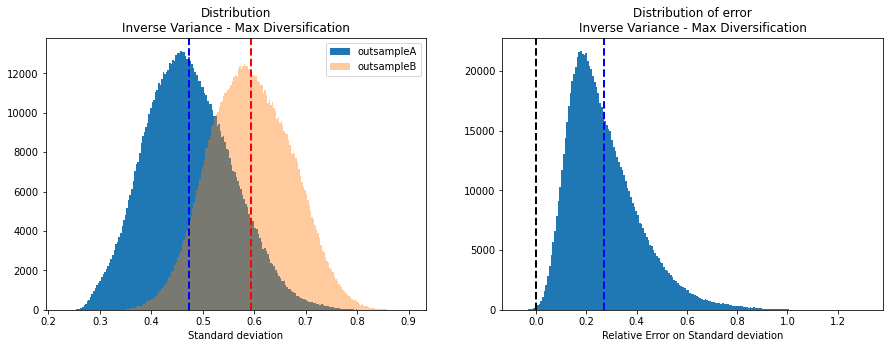

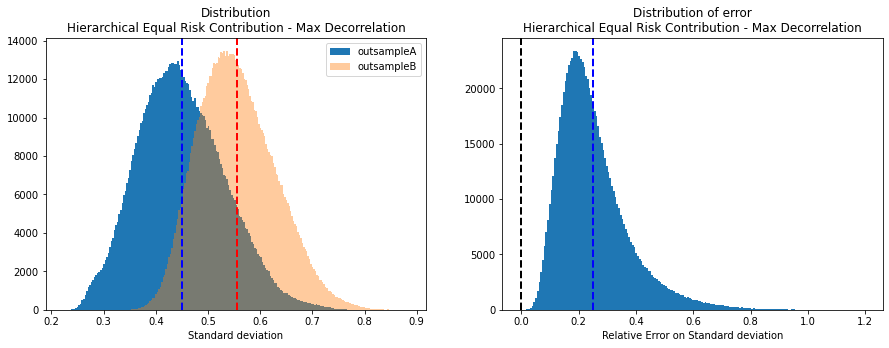

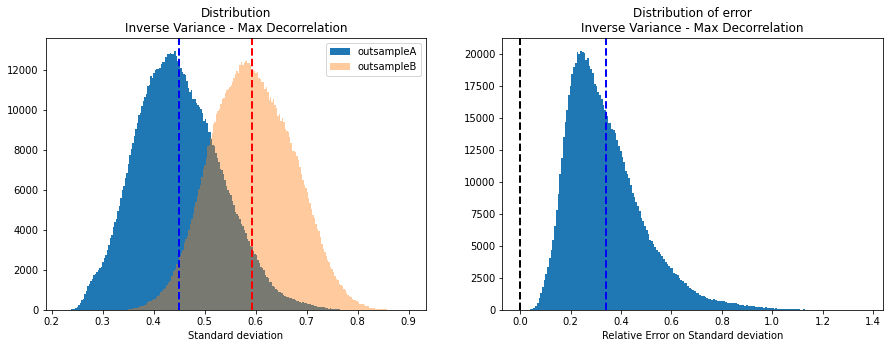

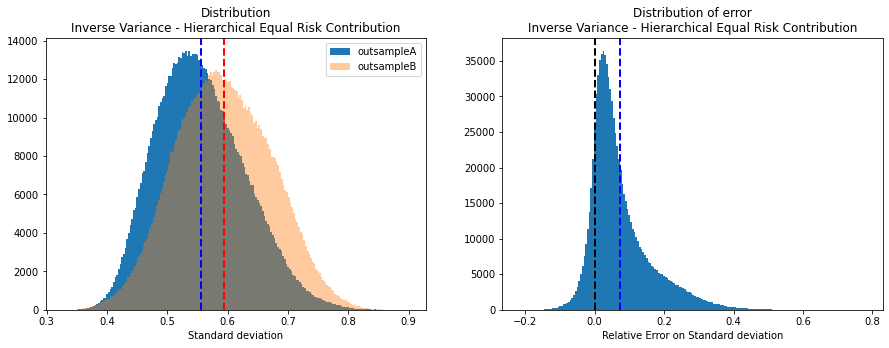

In [ ]:
name_method = pd.unique(simu_results['method'])
rk_2 = {}
metric_2 = 'Standard deviation'
for i in range(len(name_method)):
    for j in range(i+1, len(name_method)):
        rk_2[f"{name_method[j]}-{name_method[i]}"] = show_distribution_2(metric_2, 
                                                     name_method[i], name_method[j],
                                                     simu_results)
        print('')

### Relative error ranking

#### Outsample - Insample

In [ ]:
rk = pd.DataFrame(rk_1.items(), columns=['Method', 'Relative error'])
rk.sort_values(by=['Relative error'], inplace=True)
rk.index.name = metric_1
rk

,Method,Relative error
Standard deviation,,
1,Hierarchical Risk Parity,0.000180
6,Inverse Variance,0.005103
5,Hierarchical Equal Risk Contribution,0.009646
4,Max Decorrelation,0.066025
2,Max Return Min Volatility,0.084254
0,Min Volatility,0.084393
3,Max Diversification,0.089766


#### OutsampleA - OutsampleB

In [ ]:
rk = pd.DataFrame(rk_2.items(), columns=['Method', 'Relative error'])
rk.sort_values(by=['Relative error'], inplace=True)
rk.index.name = metric_2
rk

,Method,Relative error
Standard deviation,,
1,Max Return Min Volatility-Min Volatility,0.000560
10,Inverse Variance-Hierarchical Risk Parity,0.004727
3,Max Decorrelation-Min Volatility,0.009414
12,Max Decorrelation-Max Return Min Volatility,0.009959
11,Max Diversification-Max Return Min Volatility,0.043852
2,Max Diversification-Min Volatility,0.044429
15,Max Decorrelation-Max Diversification,0.050757
9,Hierarchical Equal Risk Contribution-Hierarchi...,0.057784
20,Inverse Variance-Hierarchical Equal Risk Contr...,0.072177


### Evaluate relation

In [ ]:
def compute_shap_val(Y, title, data):
    global features_name
    X_train, X_test, Y_train, Y_test = (sklearn.model_selection
                                        .train_test_split(data[features_name], Y, 
                                                          test_size=0.33, 
                                                          random_state=42))
    rf = RandomForestRegressor(random_state=42, n_estimators=10, max_depth=10)
    rf.fit(X_train, Y_train)
    blank = ['' for _ in range(len(features_name))]

    for l, x in zip(['train', 'test'],[(X_train, Y_train), (X_test, Y_test)]):
        data = x[0]
        shap_val = shap.TreeExplainer(rf)(data)
        plt.figure(figsize=(16, 8))

        plt.subplot(1, 2, 1)
        plt.title(f"{title}\nScore on {l} set = {round(rf.score(x[0], x[1]),2)}\n")
        shap.summary_plot(shap_val, axis_color="black", plot_type='bar',show=False, plot_size=None);
        plt.subplot(1, 2, 2)
        shap.summary_plot(shap_val, axis_color="black", feature_names=blank, plot_size=None);


#### Evaluate relation $\frac{risk_{outsample} - risk_{insample}}{risk_{insample}}$

In [ ]:
def evaluate_relation_1(metric, name_method, simu_results):
    grouped_df = simu_results.groupby(['regime'])
    for name, group in grouped_df:
        df = group[group['method'] == name_method]
        insample = df[f'insample_{metric}'].to_numpy()
        outsample = df[f'outsample_{metric}'].to_numpy()
        Y = (outsample - insample) / insample
        title = f'{name} - {name_method}\n{metric}'
        compute_shap_val(Y, title, df)

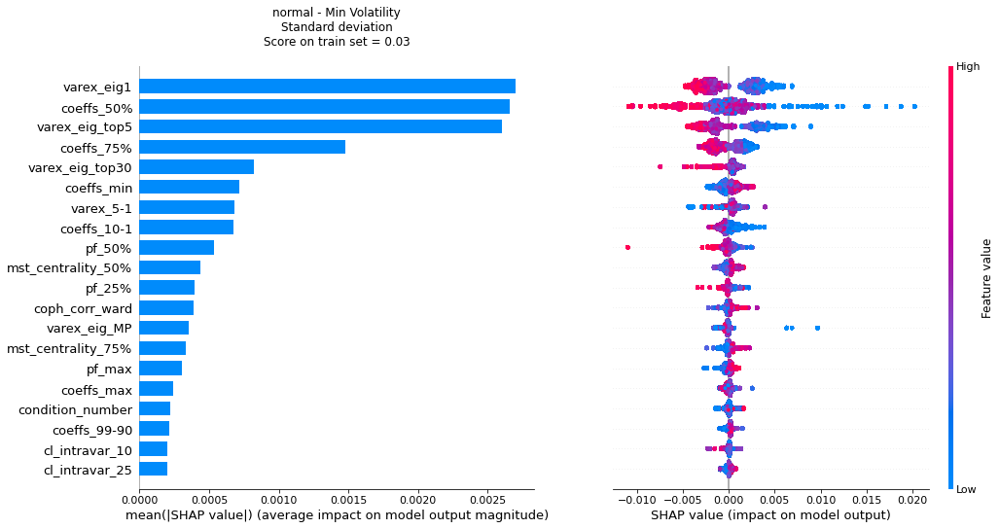

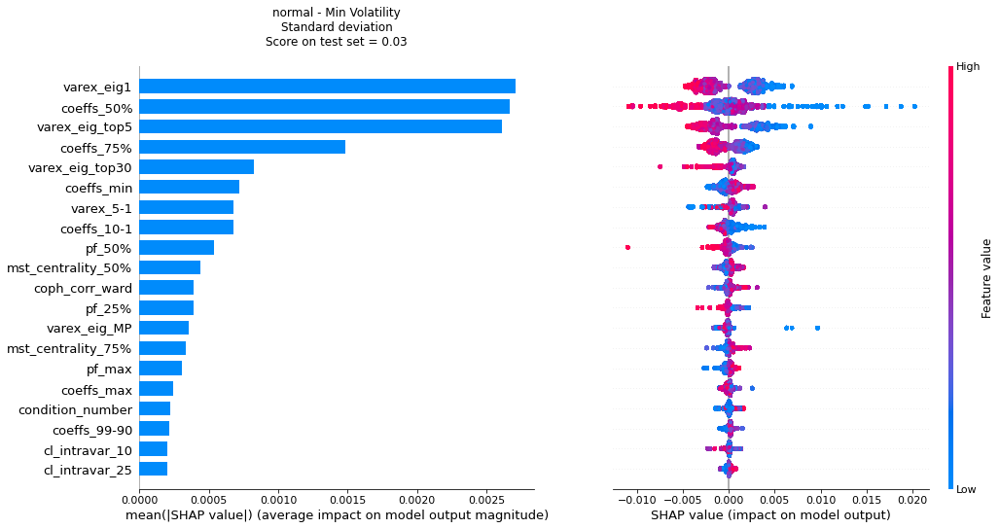

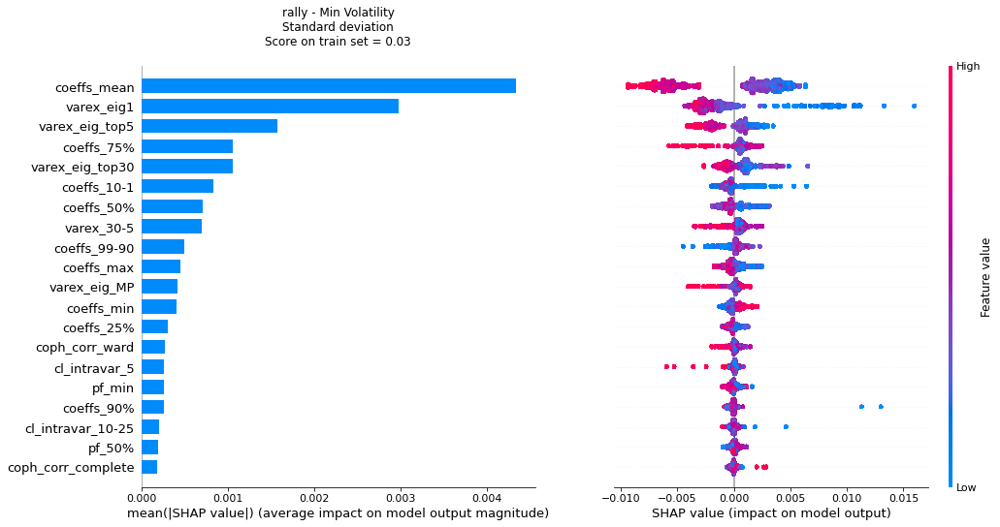

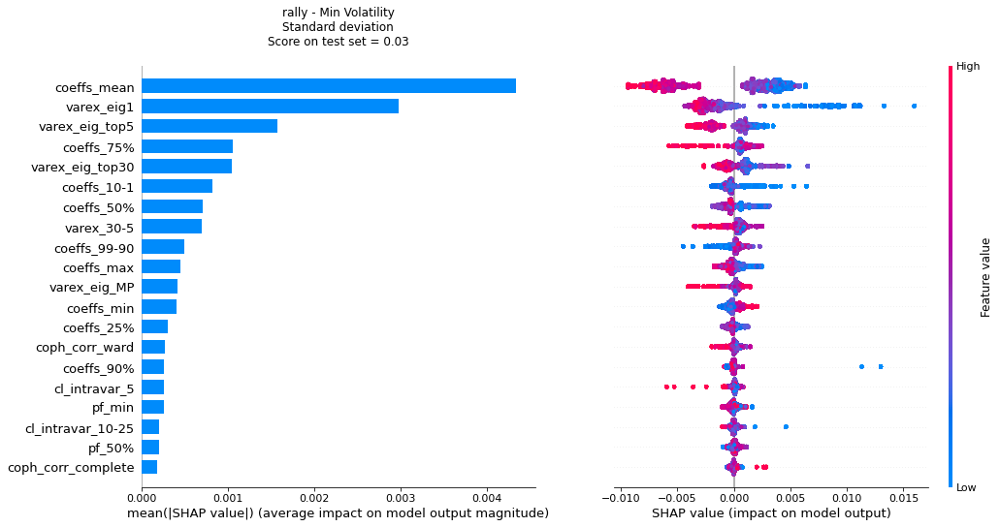

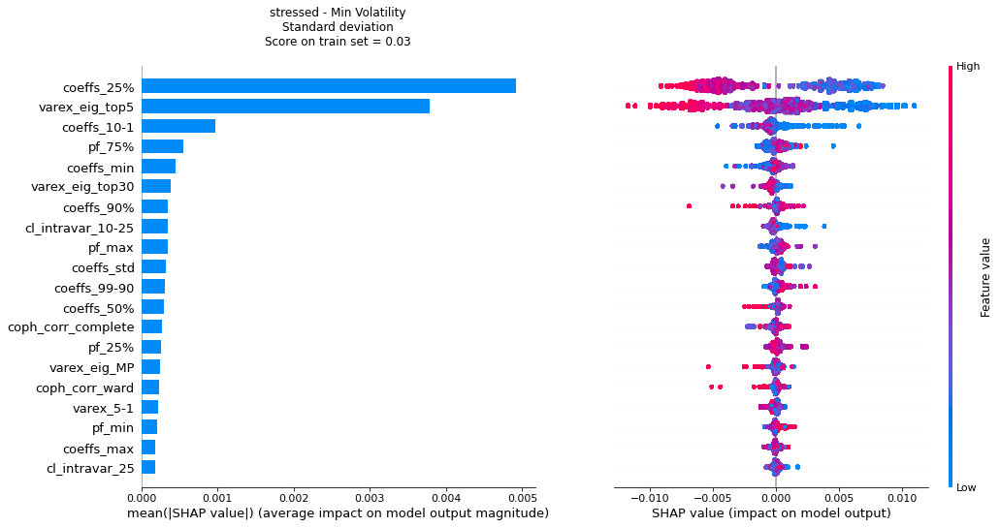

...

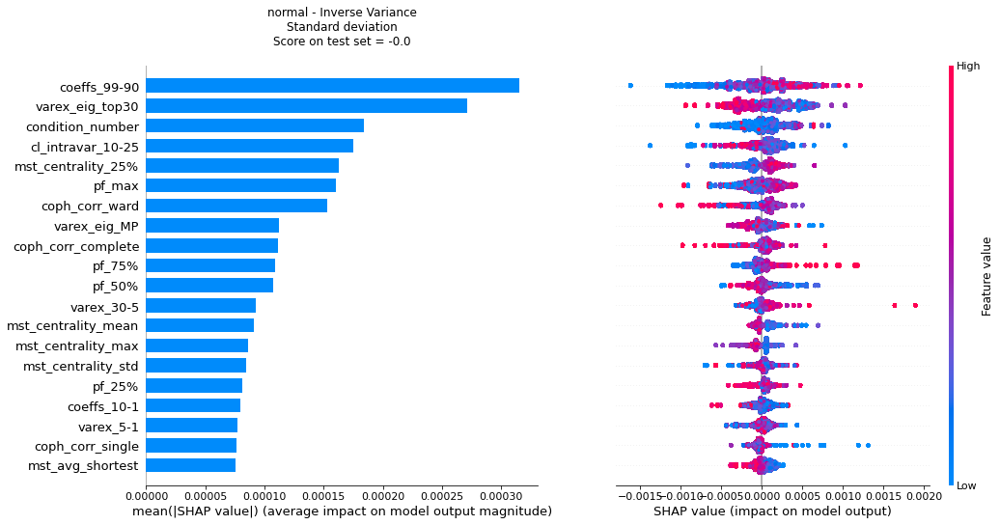

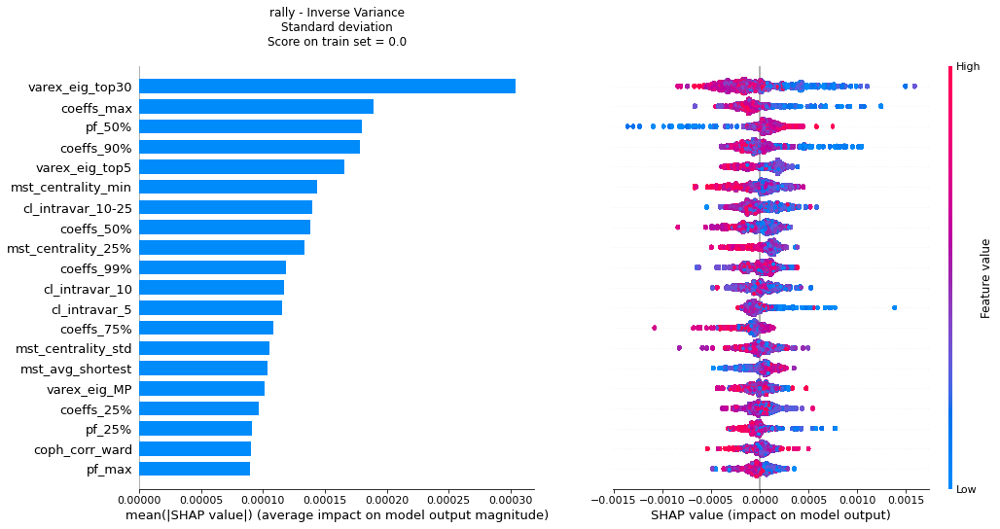

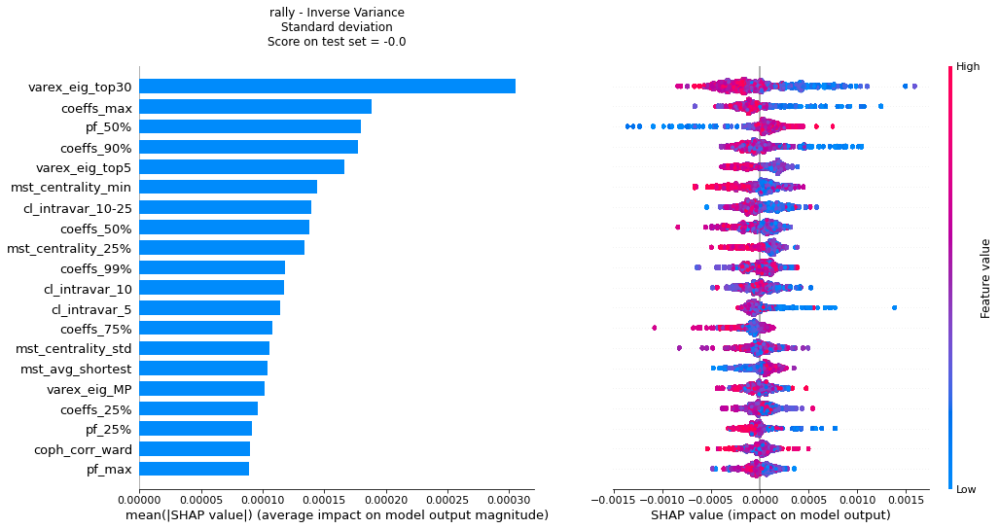

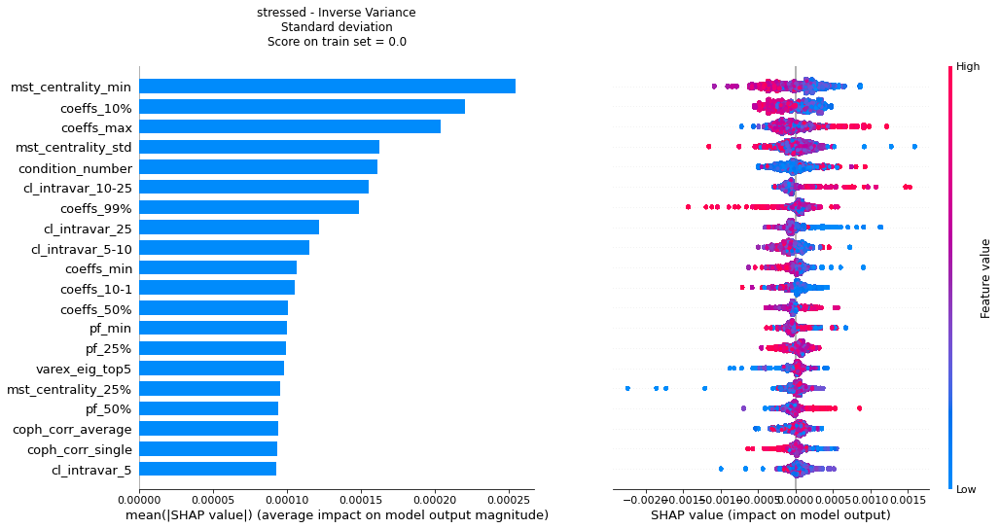

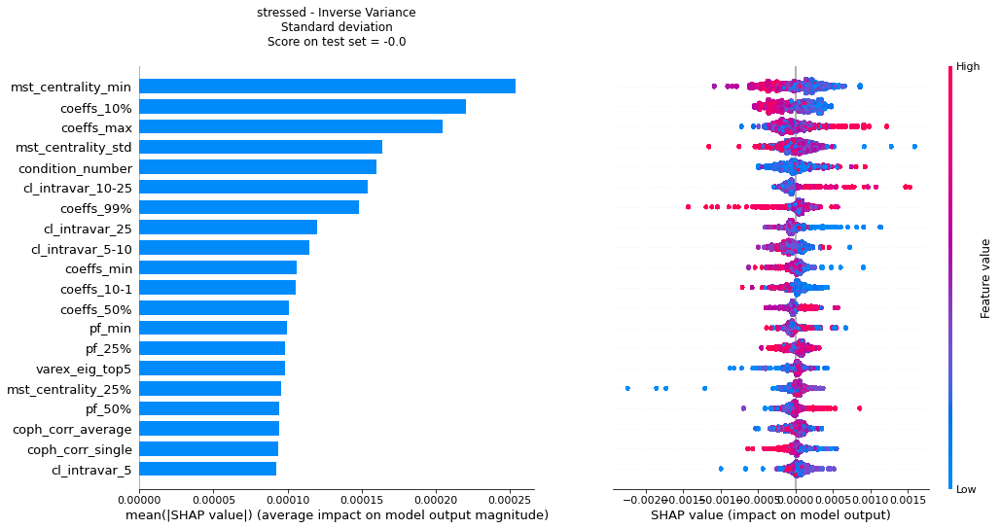

In [ ]:
for m in pd.unique(simu_results['method']):
    evaluate_relation_1('Standard deviation', m, simu_results)
    print('')

#### Evaluate relation $outsample_{modelA} - outsample_{modelB}$

In [ ]:
def evaluate_relation_2(metric, name_methodA, name_methodB, simu_results):
    grouped_df = simu_results.groupby(['regime'])
    for name, group in grouped_df:
        methodA = group[group['method'] == name_methodA]
        methodB = group[group['method'] == name_methodB]
        outsampleA = methodA[f'outsample_{metric}'].to_numpy()
        outsampleB = methodB[f'outsample_{metric}'].to_numpy()

        Y = outsampleA - outsampleB

        title = f'{name} - {name_methodA} & {name_methodB}\n{metric}'
        compute_shap_val(Y, title, methodA)


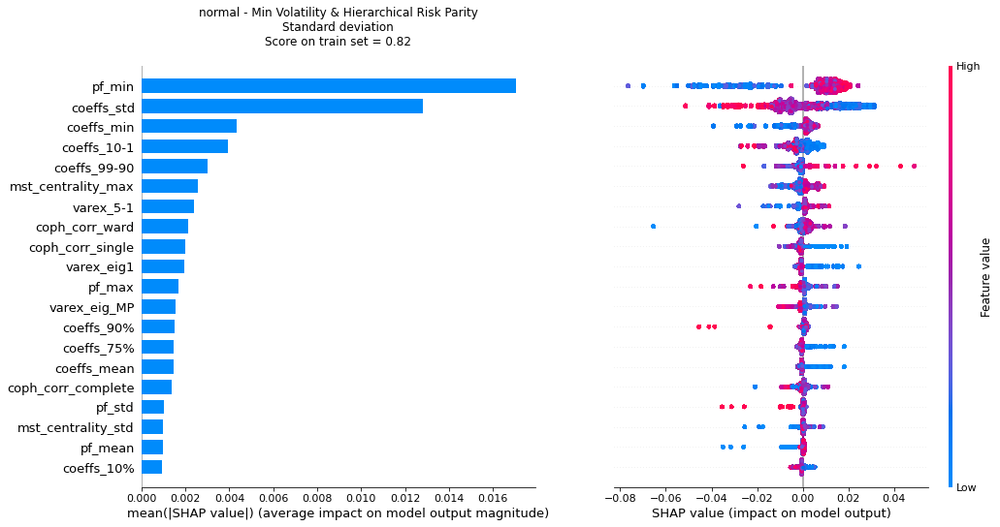

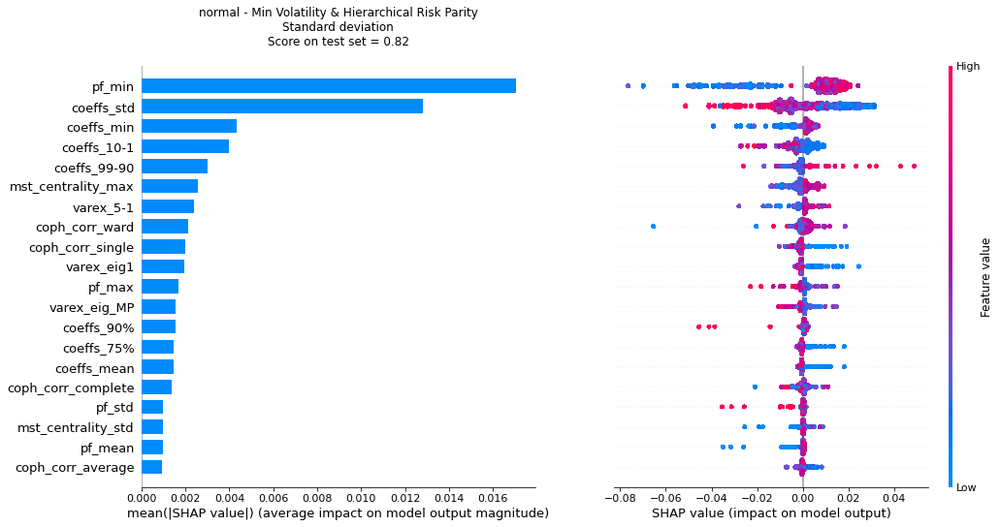

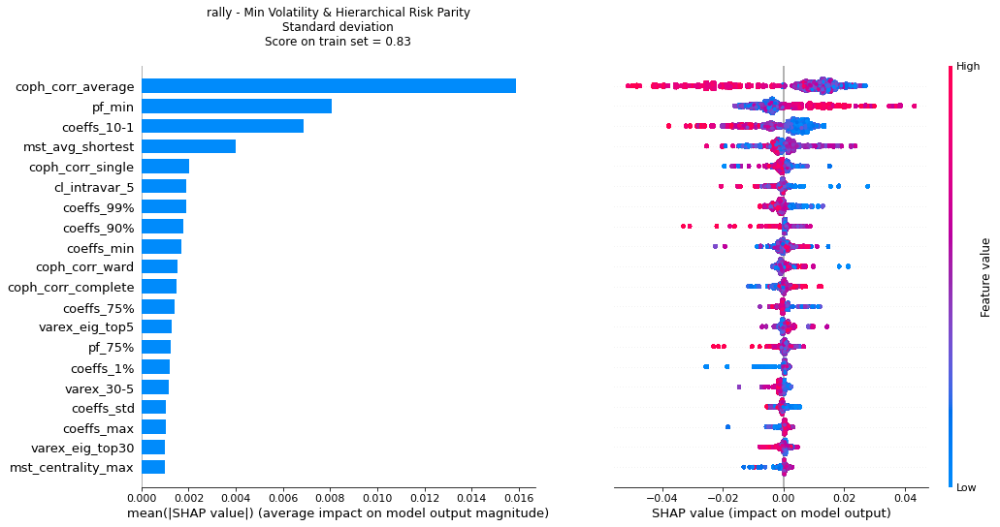

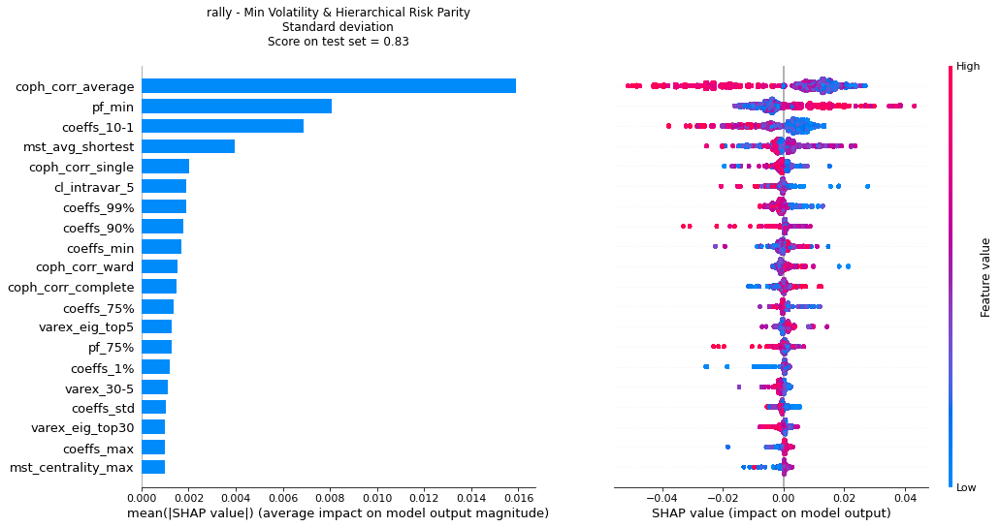

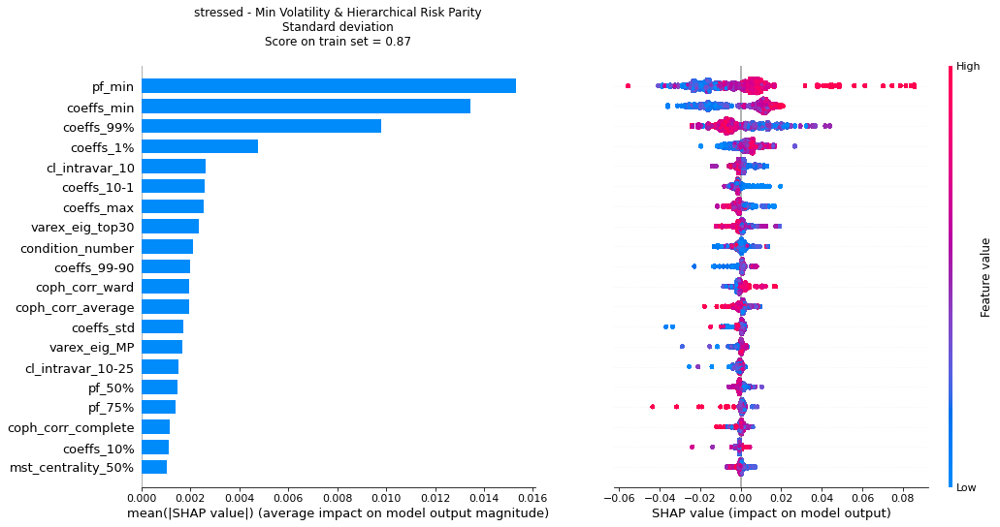

...

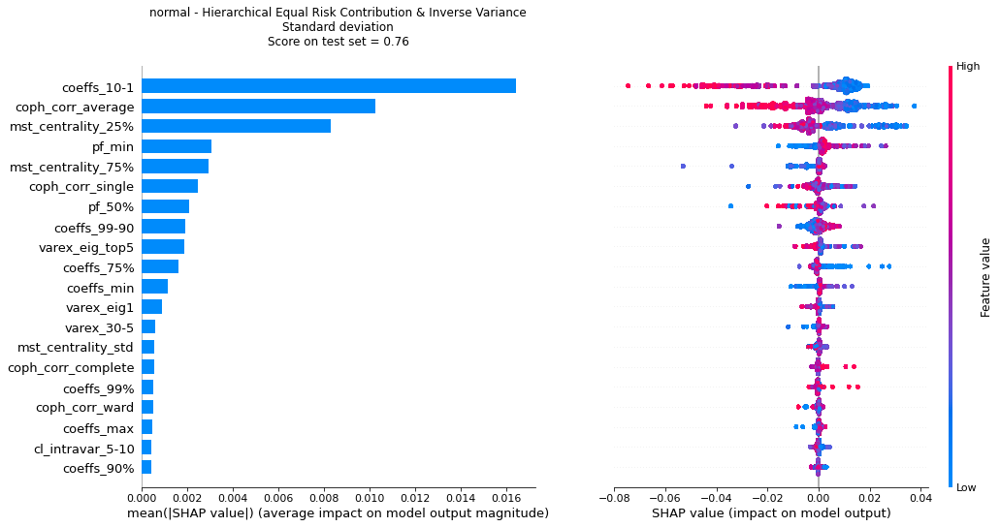

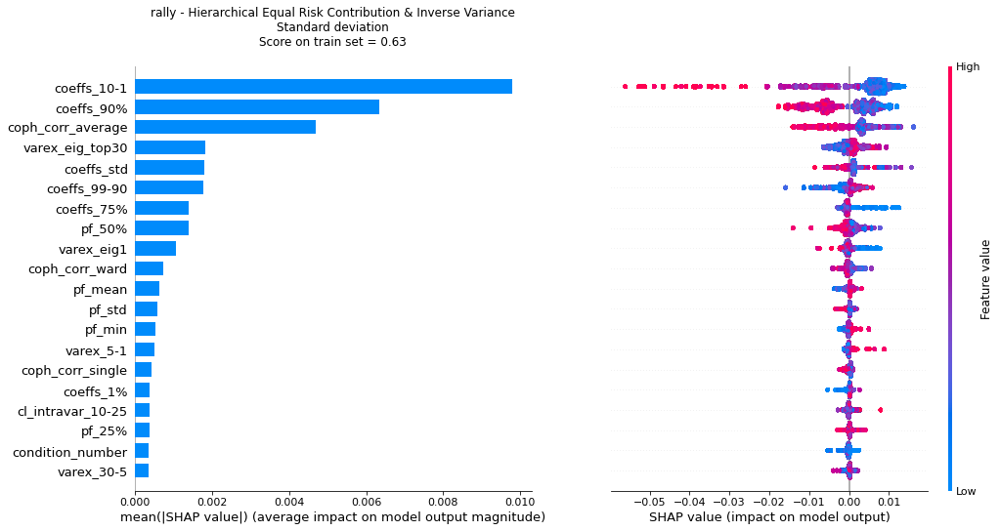

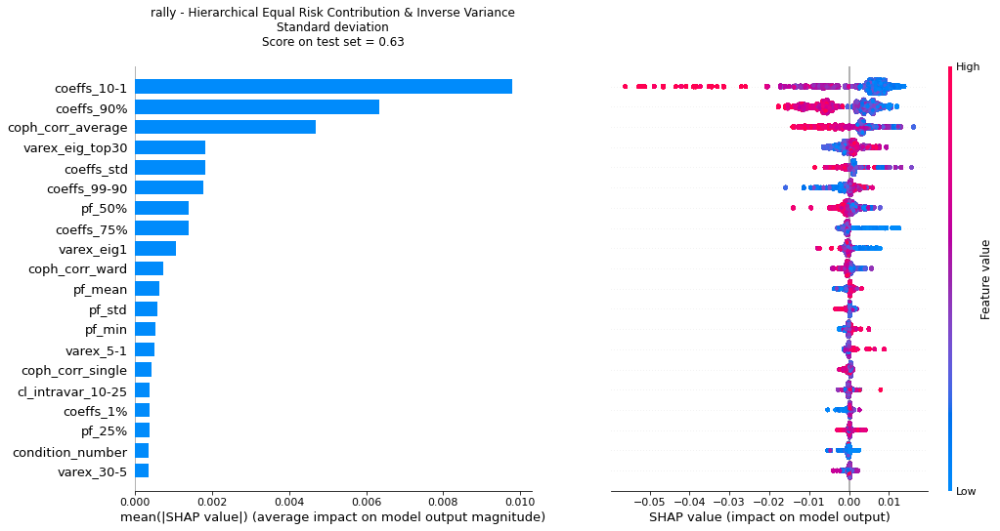

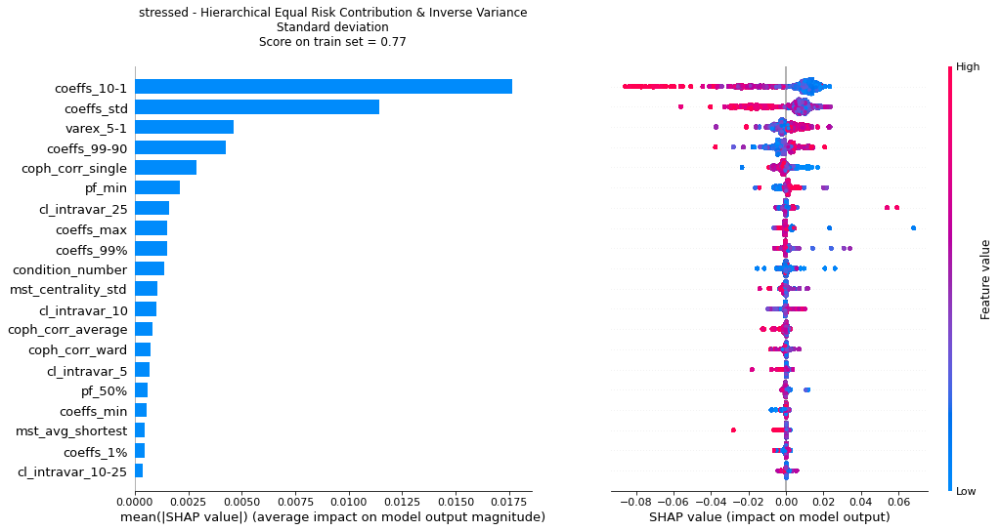

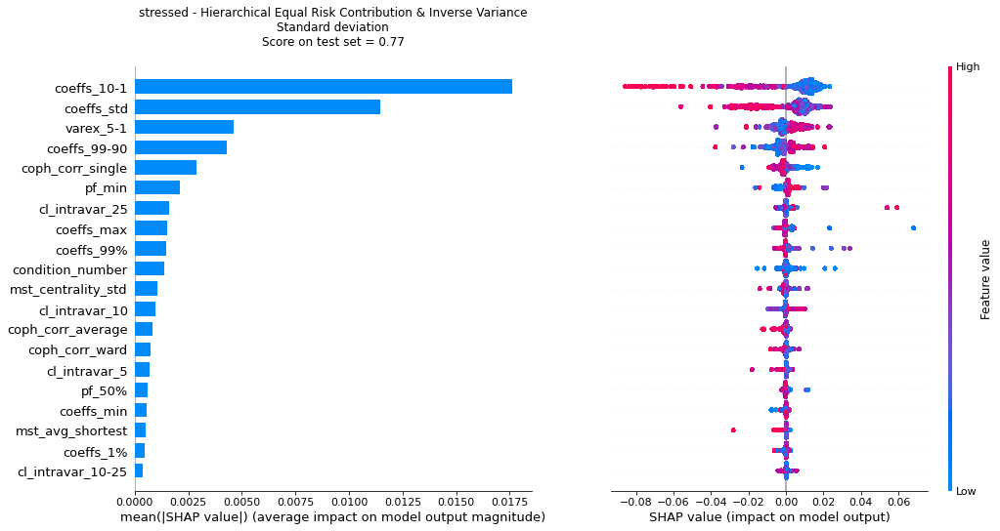

In [ ]:
name_method = pd.unique(simu_results['method'])
for i in range(len(name_method)):
    for j in range(i+1, len(name_method)):
        evaluate_relation_2('Standard deviation',
                            name_method[i], name_method[j],
                            simu_results)
        print('')